# Udacity Self Driving Car Nanodegree
## Advanced Lane Finding Project
### Brian Fischer


## Table of Contents
[Introduction](#introduction)
1. [Camera Calibration](#calibration)
2. [Perspective Transform](#perspective)
3. [Thresholded Binary Image](#binary)
4. [Detect Lane Lines](#detection)
5. [Determine Lane Curvature](#curvature)
6. [Reproject Lane Boundaries](#boundaries)
Warp the detected lane boundaries back onto the original image
7. [Overlay Calculations](#calculations)
Output a visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position!

## Introduction <a name="introduction"></a>

The goal of this project is to develop a software pipeline which identifies lane boundaries from a front-facing camera on a vehicle.  Images are provided by Udacity for calibration and driving scenarios.

For this project, I will use OpenCV to read and process images.  It is important to note that OpenCV reads images in the BGR format where matplotlib uses RGB.

## Imports <a name="imports"></a>
All of the required project imports are listed at the top of this notebook

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
from ipywidgets import interact, interactive, fixed
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline

DEBUG = 2

## Step 1 - Camera Calibration <a name="calibration"></a>
In this section, we gather and inspect calibration data to correct for lens distortion and misalignment with respect to the imager.
Lesssons 13.3 through 13.11 provide example code and information on this topic.

We start by inspecting the calibration images to determine:
1. The image properties (dimensions, type)
2. The number of "corners" (intersections of 4 squares)
3. The quality of the calibration image set (if there are any issues)

20 calibration images found
Calibration Image Shape: (720, 1280, 3)
Calibration Image Aspect Ratio:  1.778


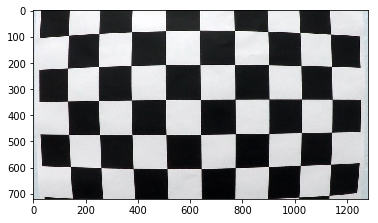

All calibration images:


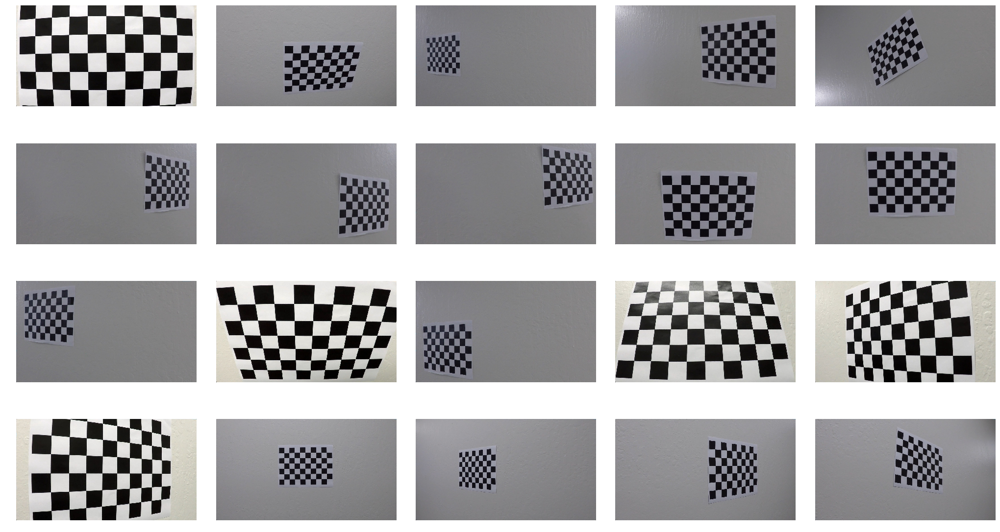

In [2]:
# List all calibration image names
images = glob.glob('camera_cal/calibration*.jpg')
print(len(images), 'calibration images found')

img = cv2.imread(images[0])
print("Calibration Image Shape:", img.shape)
plt.imshow(img)
aspect_ratio = img.shape[1]/img.shape[0]
print("Calibration Image Aspect Ratio: ", format(aspect_ratio, ".3f"))
plt.show()
print("All calibration images:")

# Setup the plot
plt.figure( figsize=(16*aspect_ratio,16) )

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
    img = cv2.imread(fname)
    plt.subplot(4,5,i+1)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
plt.tight_layout()

The calibration images have a height of 720 pixels and width of 1280 pixels.
It is also observed that some of the calibration images are missing corners.  We will exclude these from the calibration set since it is better to have additional corners than additional images of poor quality.

The next step below is to iterate through the calibration images of good quality and find the corners.
&nbsp;

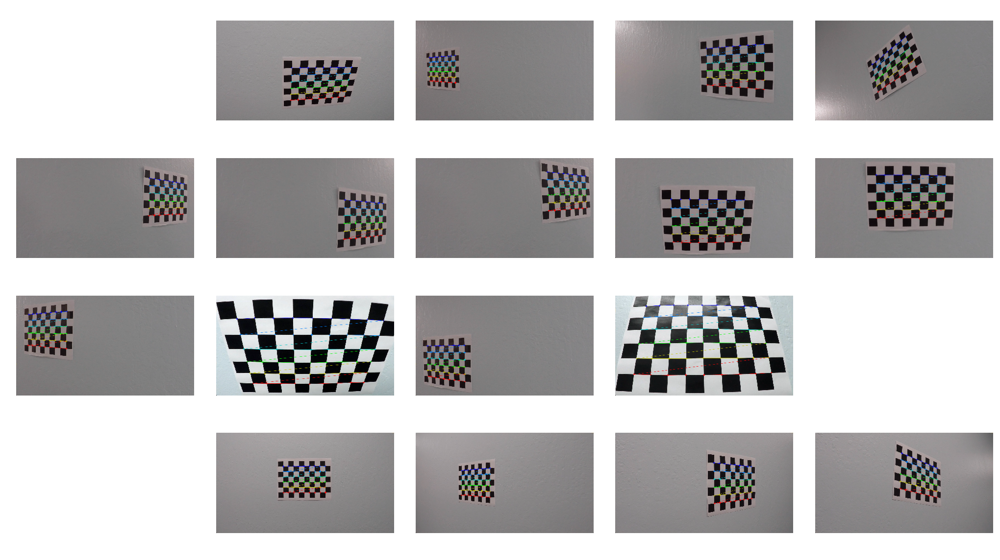

In [3]:
# Define the number of corners
nx = 9   # horizontal corners
ny = 6   # vertical corners

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# List all calibration image names
images = glob.glob('camera_cal/calibration*.jpg')

img = cv2.imread(images[0])
aspect_ratio = img.shape[1]/img.shape[0]

# Setup the plot
plt.figure( figsize=(16*aspect_ratio,16) )

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    plt.subplot(4,5,i+1)
    plt.axis("off")
    
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)      

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        plt.imshow(img)
        
plt.tight_layout()

The blank items above indicate the calibration images that were not of sufficient quality (corners were missing).

We now have `objpoints` and `imgpoints` needed for camera calibration.  Run the cell below to calibrate, calculate distortion coefficients, and test undistortion on an image!

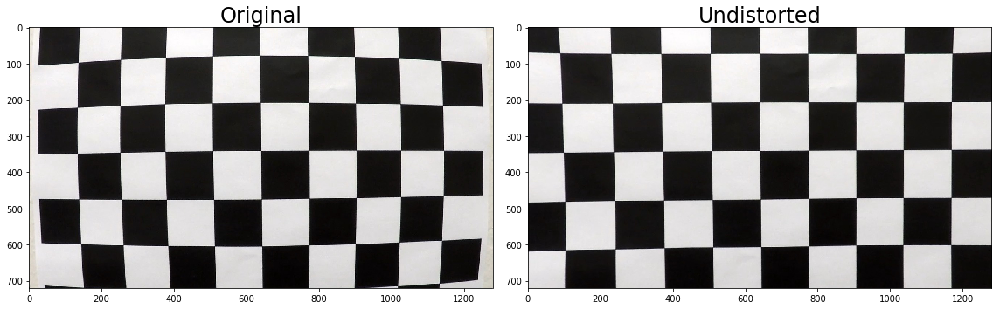

In [4]:
# Test undistortion on an image - we select the calibration image with the most visible of distortion
img = cv2.imread('camera_cal/calibration1.jpg')

# Do camera calibration given object points and image points for multiple camera calibration images
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

# Undistort a test image
undistorted = cv2.undistort(img, mtx, dist, None, mtx)
#cv2.imwrite('calibration_wide/test_undist.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_cal/calibration.p", "wb" ) )

fig = plt.figure(figsize=(16,16))
plt.subplot(121)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original', fontsize=24)
plt.subplot(122)
plt.imshow(cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
plt.title('Undistorted', fontsize=24)
plt.tight_layout()

Upon inspection of the calibration quality, it appears the left portion of the image does not have the best calibration as the line is skewed.  This could be corrected by additional calibration images.  Since we don't have the camera we will accept this for now.

The code below displays original and undistorted test images.

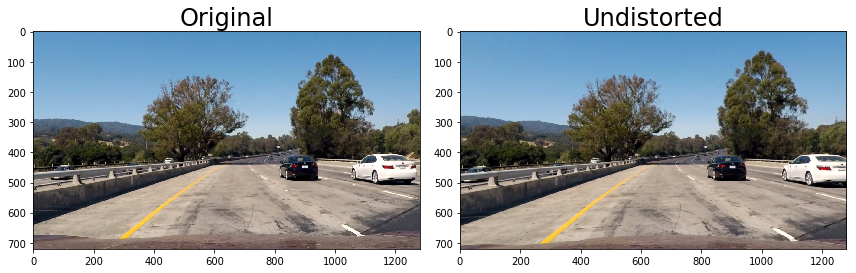

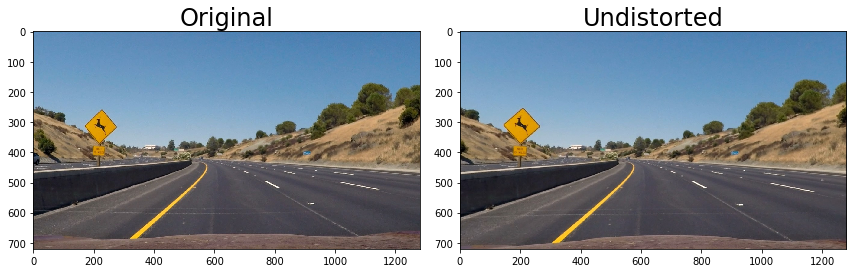

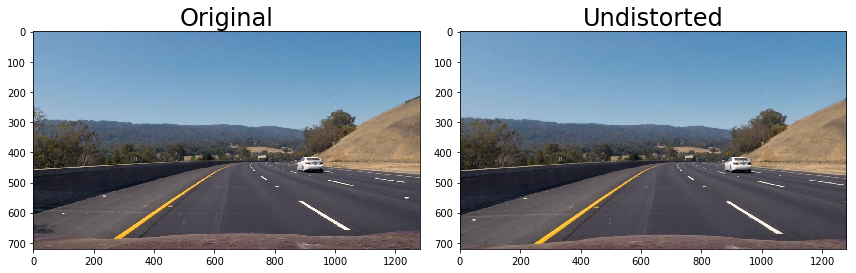

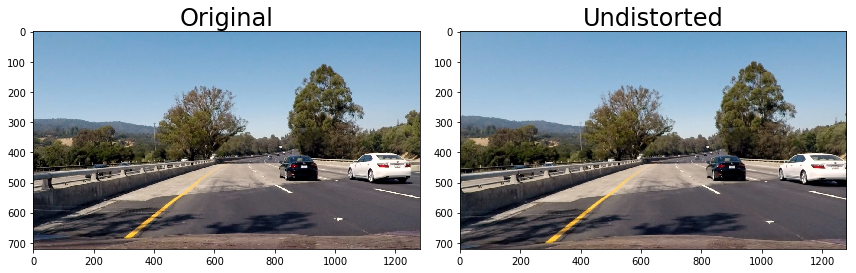

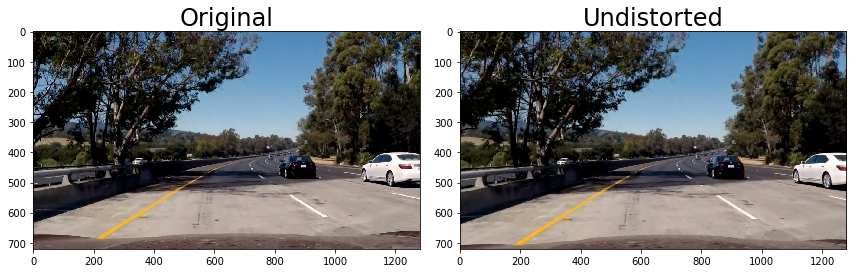

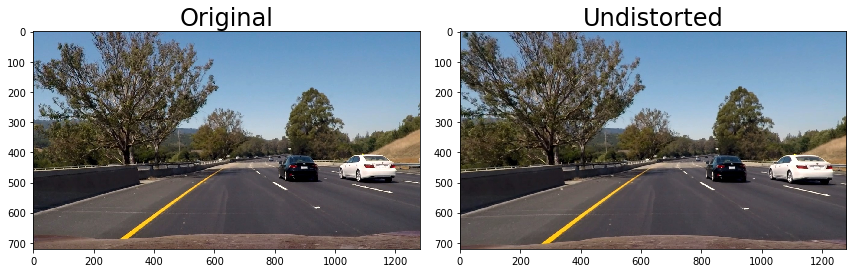

In [5]:
test_images = glob.glob('test_images/test*.jpg')

for i, fname in enumerate(test_images):
    img = cv2.imread(fname)
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    fig = plt.figure(figsize=(12,12))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original', fontsize=24)
    plt.subplot(1,2,2)
    plt.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    plt.title('Undistorted', fontsize=24)
    plt.tight_layout()

It is most readily observed the hood of the car is mostly removed in the undisorted images.  In addition, some of the information on the edge of the images is removed in the undistorted image which slightly reduces the field of view.

We then define an abstraction function for undistoration for use with the pipeline:

In [6]:
def undistort(img):
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

## Step 2 - Perspective Transform<a name="perspective"></a>

I decided to do a perspective transform before attempting to detect the lane lines.  It is easier for me to visualize the best thresholding from a birds eye perspective.

I will use the straight lines example images for the undistortion assuming the road surface is flat.
The test image is read in, then we apply our camera calibration to undistort the image.  The next step is to select the points within the image for the perspective transform to a birds eye view.

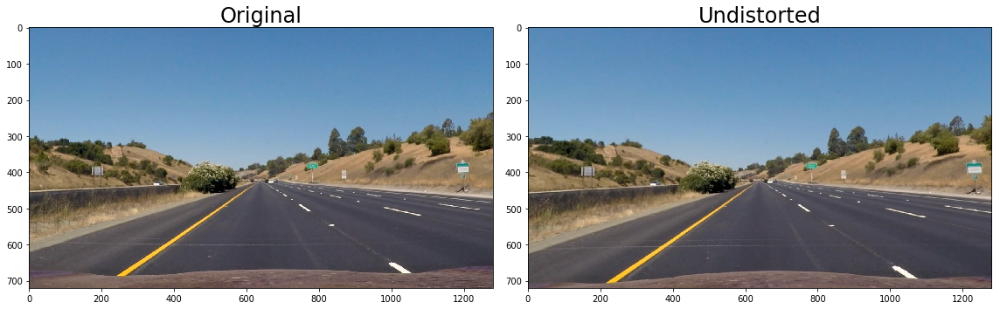

In [7]:
img = cv2.imread('test_images/straight_lines1.jpg')
img_undistort = undistort(img)
cv2.imwrite('output_images/straight_lines1_undistort.jpg', img_undistort)

fig = plt.figure(figsize=(16,16))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original', fontsize=24)
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(img_undistort, cv2.COLOR_BGR2RGB))
plt.title('Undistorted', fontsize=24)
plt.tight_layout()

In [8]:
# Define the function for the perspective transform for the pipeline
def birds_eye_view(img, src, dst):
    img_size = (img.shape[1], img.shape[0])
    # use cv2.getPerspectiveTransform() to get M, the transform matrix, and Minv, the inverse
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M, Minv

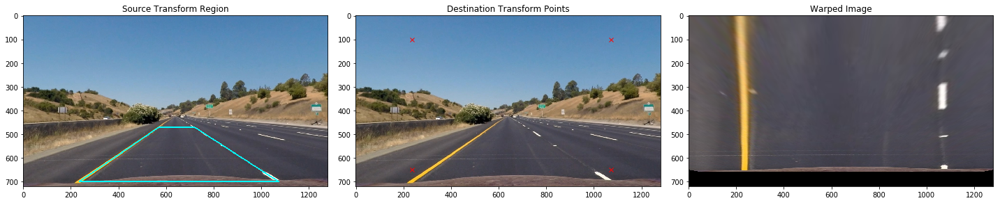

In [9]:
# Manually selecting points for transform
# Order is starting at top right going clockwise around the trapezoid
img = cv2.imread('test_images/straight_lines1.jpg')
img_undistort = undistort(img)
tf_img = img_undistort.copy()

src = np.float32([(718, 470),
                  (1072,700),
                  (235, 700),
                  (570, 470)])

dst = np.float32([(1072,100),
                  (1072,650),
                  (235,650),
                  (235,100)])


# Plot our source transform using OpenCV polylines function
# https://docs.opencv.org/3.1.0/dc/da5/tutorial_py_drawing_functions.html
pts = src.astype(np.int32)
pts = pts.reshape((-1,1,2))
cv2.polylines(tf_img,[pts],True,(255,255,0), thickness=3)

# Obtain one birds eye view image
img_bev, M, Minv = birds_eye_view(img_undistort, src, dst)

# Plot the results for review
fig = plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
plt.title('Source Transform Region')
plt.imshow(cv2.cvtColor(tf_img, cv2.COLOR_BGR2RGB))
plt.subplot(1,3,2)
plt.title('Destination Transform Points')
plt.imshow(cv2.cvtColor(img_undistort, cv2.COLOR_BGR2RGB))
for point in dst:
    plt.plot(point[0],point[1],'x',color='red')
plt.subplot(1,3,3)
plt.title('Warped Image')
plt.imshow(cv2.cvtColor(img_bev, cv2.COLOR_BGR2RGB))
plt.tight_layout()

The above images demonstrate the source and destination points for the transform.  The warped image on the right shows an acceptable number of lane markings with parallel lane lines.

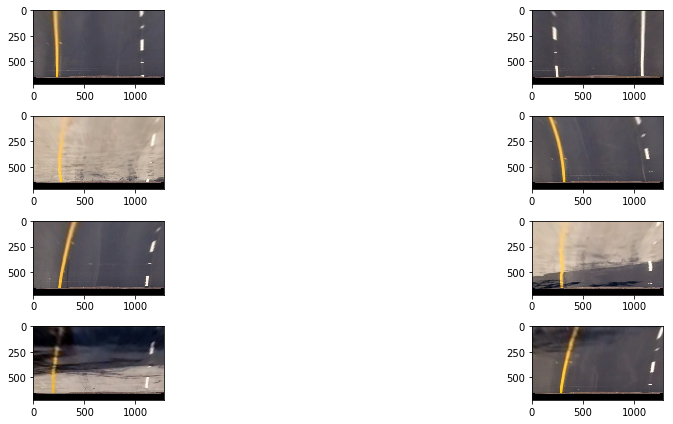

In [10]:
test_images = glob.glob('test_images/*.jpg')
fig = plt.figure(figsize=(14,6))

for i, fname in enumerate(test_images):
    img = cv2.imread(fname)
    img_undistort = undistort(img)
    plt.subplot(4,4,i*2+1)
    img_bev, M, Minv = birds_eye_view(img_undistort, src, dst)
    plt.subplot(4,4,i*2+1)
    plt.imshow(cv2.cvtColor(img_bev, cv2.COLOR_BGR2RGB))
plt.tight_layout()

## Step 3 - Thresholded Binary Image<a name="binary"></a>

The purpose of this step is to create a binary image that only contains pixels likely to contain lane lines.
We model the order of our filters based upon human intuition.  First, we look at the color of objects within a region of interest.  Next, we look at the shape of those objects.
Since lane lines are yellow and white, we will create inclusive filters for these colors.
Since the lane lines will be near vertical, we can use this information during gradient threshold filters.

Methods for creating this thresholded binary image from the source images are as follows:
* Color Transforms
* Gradient Thresholds

#### Color Transforms Used:
1. Inclusive only filter for yellow and white<br>
Lane lines are yellow or white

2. L channel threshold<br>
Ignore lighting conditions (shadows and bright light)

3. S channel threshold<br>
Separates white and yellow lanes well

#### Grandient Thresholds Reviewed:
1. Directional
2. Magnitude

We first review the images in different color spaces.  From the lessons, we already know the RGB color space has issues with brightness, so we explore the other color spaces available in OpenCV:

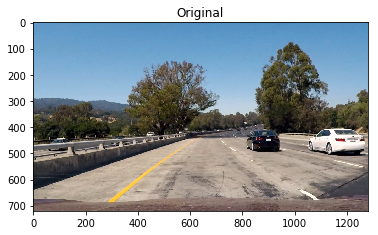

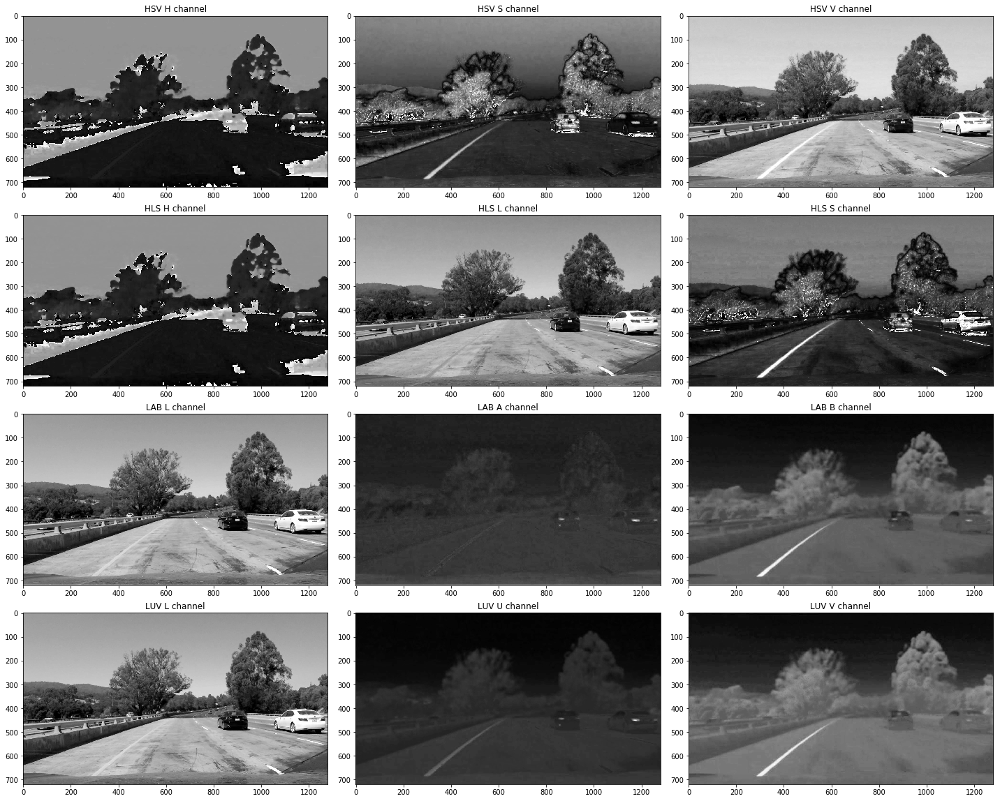

In [11]:
img = cv2.imread('test_images/test1.jpg')

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original')

plt.figure(figsize=(20,16))

img_HSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
plt.subplot(4,3,1)
plt.imshow(img_HSV[:,:,0], cmap='gray')
plt.title('HSV H channel')
plt.subplot(4,3,2)
plt.imshow(img_HSV[:,:,1], cmap='gray')
plt.title('HSV S channel')
plt.subplot(4,3,3)
plt.imshow(img_HSV[:,:,2], cmap='gray')
plt.title('HSV V channel')

img_HLS = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
plt.subplot(4,3,4)
plt.imshow(img_HLS[:,:,0], cmap='gray')
plt.title('HLS H channel')
plt.subplot(4,3,5)
plt.imshow(img_HLS[:,:,1], cmap='gray')
plt.title('HLS L channel')
plt.subplot(4,3,6)
plt.imshow(img_HLS[:,:,2], cmap='gray')
plt.title('HLS S channel')

img_LAB = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
plt.subplot(4,3,7)
plt.imshow(img_LAB[:,:,0], cmap='gray')
plt.title('LAB L channel')
plt.subplot(4,3,8)
plt.imshow(img_LAB[:,:,1], cmap='gray')
plt.title('LAB A channel')
plt.subplot(4,3,9)
plt.imshow(img_LAB[:,:,2], cmap='gray')
plt.title('LAB B channel')

img_LUV = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)
plt.subplot(4,3,10)
plt.imshow(img_LUV[:,:,0], cmap='gray')
plt.title('LUV L channel')
plt.subplot(4,3,11)
plt.imshow(img_LUV[:,:,1], cmap='gray')
plt.title('LUV U channel')
plt.subplot(4,3,12)
plt.imshow(img_LUV[:,:,2], cmap='gray')
plt.title('LUV V channel')

plt.tight_layout()

Review of the above images indicates the different color spaces available in OpenCV

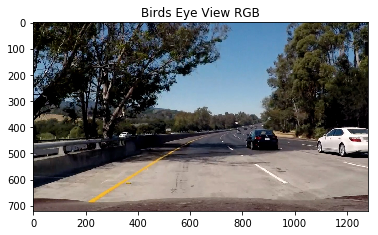

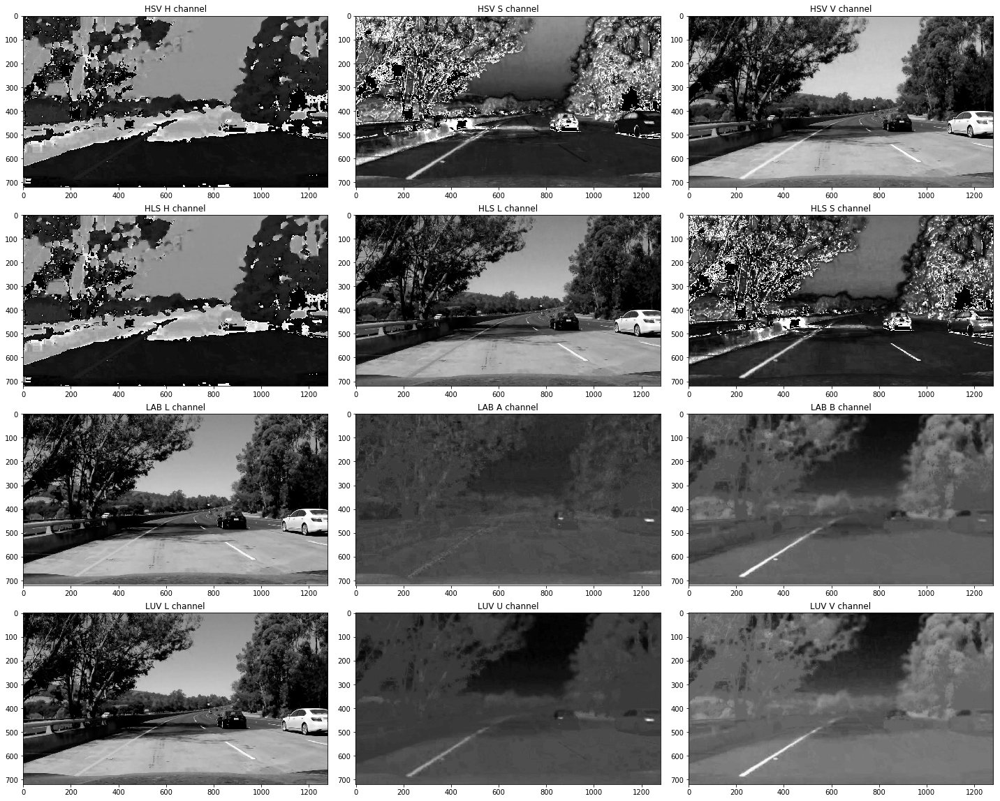

In [12]:
img = cv2.imread('test_images/test5.jpg')

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Birds Eye View RGB')

plt.figure(figsize=(20,16))

img_HSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
plt.subplot(4,3,1)
plt.imshow(img_HSV[:,:,0], cmap='gray')
plt.title('HSV H channel')
plt.subplot(4,3,2)
plt.imshow(img_HSV[:,:,1], cmap='gray')
plt.title('HSV S channel')
plt.subplot(4,3,3)
plt.imshow(img_HSV[:,:,2], cmap='gray')
plt.title('HSV V channel')

img_HLS = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
plt.subplot(4,3,4)
plt.imshow(img_HLS[:,:,0], cmap='gray')
plt.title('HLS H channel')
plt.subplot(4,3,5)
plt.imshow(img_HLS[:,:,1], cmap='gray')
plt.title('HLS L channel')
plt.subplot(4,3,6)
plt.imshow(img_HLS[:,:,2], cmap='gray')
plt.title('HLS S channel')

img_LAB = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
plt.subplot(4,3,7)
plt.imshow(img_LAB[:,:,0], cmap='gray')
plt.title('LAB L channel')
plt.subplot(4,3,8)
plt.imshow(img_LAB[:,:,1], cmap='gray')
plt.title('LAB A channel')
plt.subplot(4,3,9)
plt.imshow(img_LAB[:,:,2], cmap='gray')
plt.title('LAB B channel')

img_LUV = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)
plt.subplot(4,3,10)
plt.imshow(img_LUV[:,:,0], cmap='gray')
plt.title('LUV L channel')
plt.subplot(4,3,11)
plt.imshow(img_LUV[:,:,1], cmap='gray')
plt.title('LUV U channel')
plt.subplot(4,3,12)
plt.imshow(img_LUV[:,:,2], cmap='gray')
plt.title('LUV V channel')

plt.tight_layout()

### HLS L Channel Filter
Filter only the white lane lines

In [13]:
# Binary threshold on the HLS "L" channel
def hls_lthresh(img, thresh=(215, 255)):
    img_hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    hls_l_chan = img_hls[:,:,1]
    hls_l_chan = hls_l_chan*(255/np.max(hls_l_chan))   # Normalize the image before thresholding
    hls_l_chan_binary = np.zeros_like(hls_l_chan)      # Create binary image then store threshold
    hls_l_chan_binary[(hls_l_chan >= thresh[0]) & (hls_l_chan <= thresh[1])] = 1
    return hls_l_chan_binary

In [14]:
img = cv2.imread('test_images/test5.jpg')
img_undistort = undistort(img)
img_bev, M, Minv = birds_eye_view(img_undistort, src, dst)

def test_hls_l_chan(min_thresh, max_thresh):
    img_hls_l_test = hls_lthresh(img_bev, (min_thresh, max_thresh))

    fig = plt.figure(figsize=(16,16))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('RGB', fontsize=24)
    plt.subplot(1,2,2)
    plt.imshow(img_hls_l_test, cmap='gray')
    plt.title('HLS L Channel', fontsize=24)
    plt.tight_layout()


interact(test_hls_l_chan, min_thresh=(0,255), max_thresh=(0,255))

A Jupyter Widget

<function __main__.test_hls_l_chan>

(205, 255)


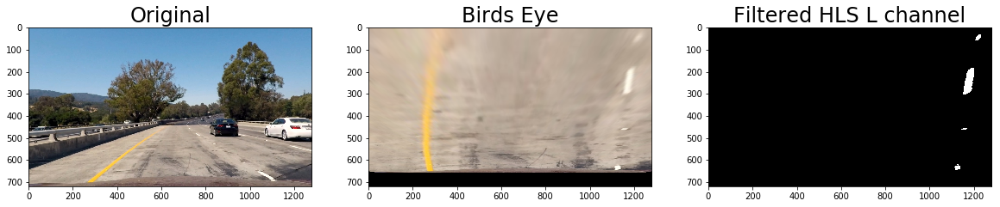

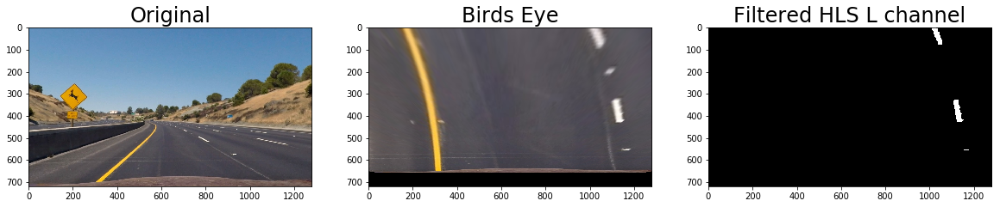

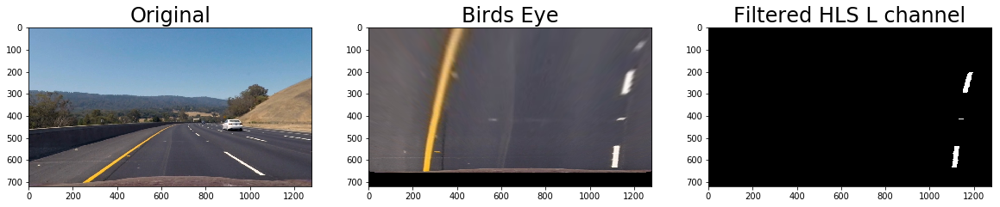

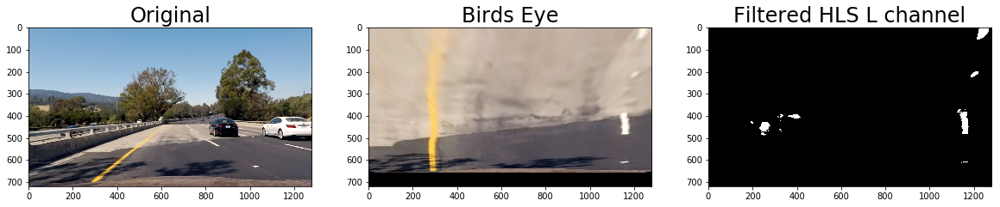

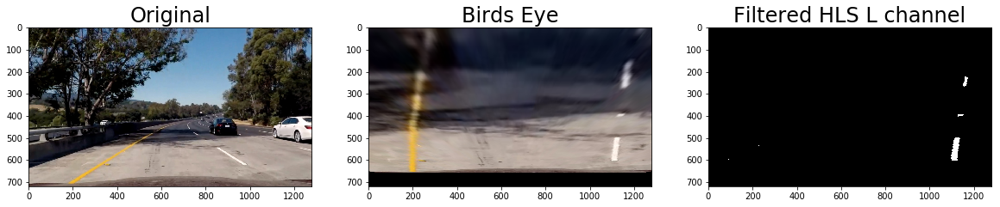

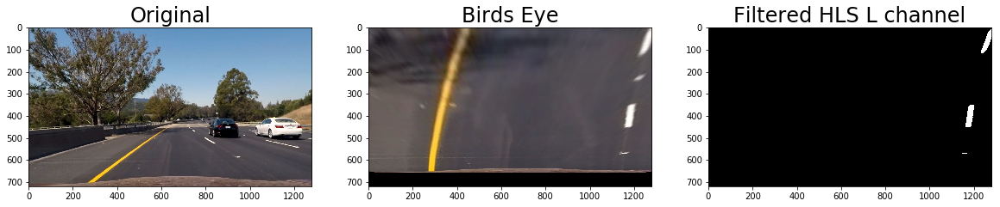

In [15]:
HLS_L_LIMITS = (205, 255)
print(HLS_L_LIMITS)

test_images = glob.glob('test_images/test*.jpg')

for i, fname in enumerate(test_images):
    img = cv2.imread(fname)
    
    undist = undistort(img)
    bev_undist, M, Minv = birds_eye_view(undist, src, dst)
    img_hls = hls_lthresh(bev_undist, HLS_L_LIMITS)
    
    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1)
    plt.title('Original', fontsize=24)
    plt.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    plt.subplot(1,3,2)
    plt.title('Birds Eye', fontsize=24)
    plt.imshow(cv2.cvtColor(bev_undist, cv2.COLOR_BGR2RGB))
    plt.subplot(1,3,3)
    plt.title('Filtered HLS L channel', fontsize=24)
    plt.imshow(img_hls, cmap='gray')

### LAB B Channel Filter
Filter only the yellow lines

In [16]:
# Binary threshold on the LAB "B" channel
def lab_bthresh(img, thresh=(185, 255)):
    img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    lab_b_chan = img_lab[:,:,2]
    lab_b_chan = lab_b_chan*(255/np.max(lab_b_chan))   # Normalize the image before thresholding
    lab_b_chan_binary = np.zeros_like(lab_b_chan)      # Create binary image then store threshold
    lab_b_chan_binary[(lab_b_chan >= thresh[0]) & (lab_b_chan <= thresh[1])] = 1
    return lab_b_chan_binary

In [17]:
img = cv2.imread('test_images/test5.jpg')
img_undistort = undistort(img)
img_bev, M, Minv = birds_eye_view(img_undistort, src, dst)

def test_lab_b_chan(min_b_thresh, max_b_thresh):
    img_lab_b_test = lab_bthresh(img_bev, (min_b_thresh, max_b_thresh))

    fig = plt.figure(figsize=(16,16))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('RGB', fontsize=24)
    plt.subplot(1,2,2)
    plt.imshow(img_lab_b_test, cmap='gray')
    plt.title('Filtered LAB B Channel', fontsize=24)
    plt.tight_layout()

interact(test_lab_b_chan, min_b_thresh=(0,255), max_b_thresh=(0,255))

A Jupyter Widget

<function __main__.test_lab_b_chan>

(183, 255)


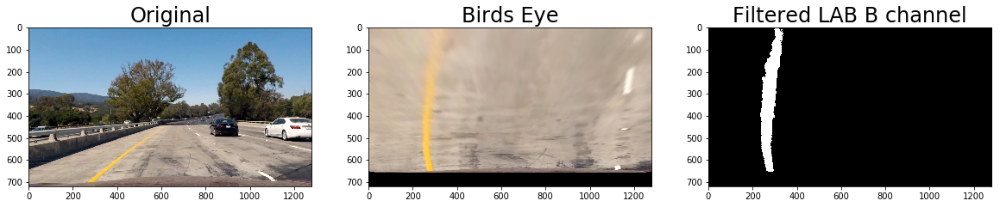

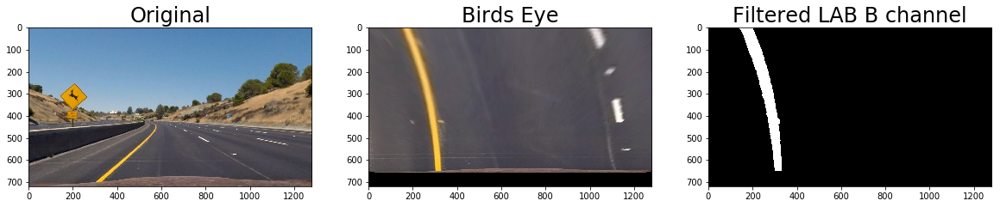

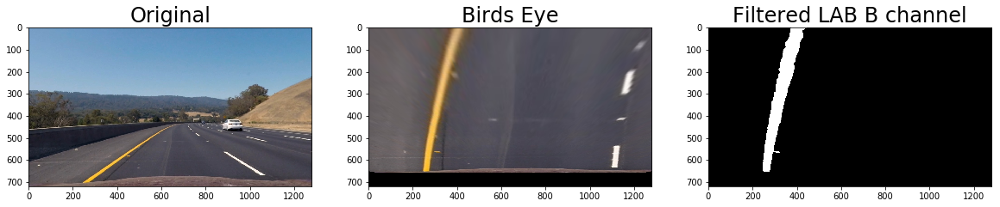

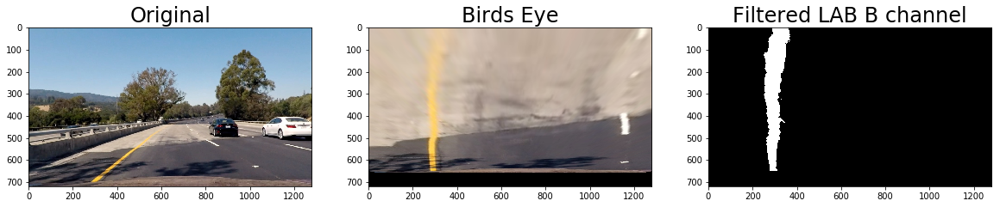

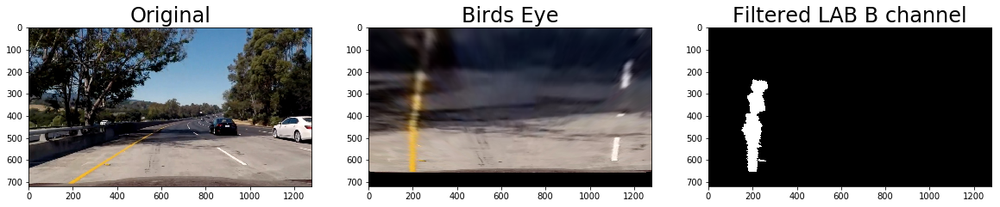

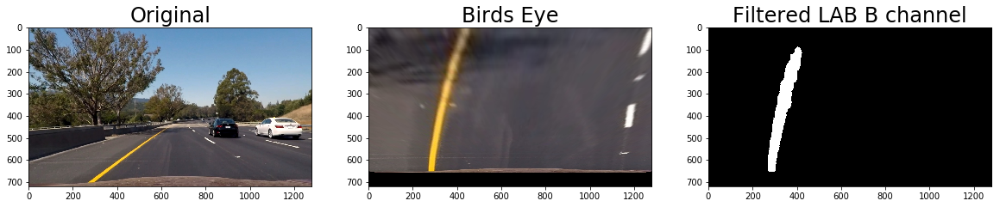

In [18]:
LAB_B_LIMITS = (183, 255)
print(LAB_B_LIMITS)
test_images = glob.glob('test_images/test*.jpg')

for i, fname in enumerate(test_images):
    img = cv2.imread(fname)
    
    undist = undistort(img)
    bev_undist, M, Minv = birds_eye_view(undist, src, dst)
    img_lab = lab_bthresh(bev_undist, LAB_B_LIMITS)
    
    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1)
    plt.title('Original', fontsize=24)
    plt.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    plt.subplot(1,3,2)
    plt.title('Birds Eye', fontsize=24)
    plt.imshow(cv2.cvtColor(bev_undist, cv2.COLOR_BGR2RGB))
    plt.subplot(1,3,3)
    plt.title('Filtered LAB B channel', fontsize=24)
    plt.imshow(img_lab, cmap='gray')

In [19]:
# Create binary thresholded images to isolate lane line pixels - no normalization
def apply_thresholds(bev_undist, show=False):
    
    # bev_undist, M, Minv = birds_eye_view(undistort(img), src, dst)
    
    s_channel = cv2.cvtColor(bev_undist, cv2.COLOR_BGR2HLS)[:,:,2]
    b_channel = cv2.cvtColor(bev_undist, cv2.COLOR_BGR2Lab)[:,:,2]
    l_channel = cv2.cvtColor(bev_undist, cv2.COLOR_BGR2HLS)[:,:,1]

    # Threshold color channel
    s_thresh_min = 180
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    b_thresh_min = 155
    b_thresh_max = 200
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1
    
    l_thresh_min = 225
    l_thresh_max = 255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1
    
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1)] = 1

    if show == True:
        # Plotting thresholded images
        plt.figure(figsize=(16,16))
        plt.subplot(151)
        plt.title('Birds Eye View')
        plt.imshow(cv2.cvtColor(bev_undist, cv2.COLOR_BGR2RGB).astype('uint8'))
        plt.axis('off')
        plt.subplot(152)
        plt.title('HLS S')
        plt.imshow(s_binary, cmap='gray')
        plt.axis('off')
        plt.subplot(153)
        plt.title('LAB B')
        plt.imshow(b_binary, cmap='gray')
        plt.axis('off')
        plt.subplot(154)
        plt.title('HLS L')
        plt.imshow(l_binary, cmap='gray')
        plt.axis('off')
        plt.subplot(155)
        plt.title('Combined')
        plt.imshow(combined_binary, cmap='gray')
        plt.axis('off')       
        plt.tight_layout()
        plt.show()
        
    else: 
        return combined_binary

In [20]:
# Create binary thresholded images to isolate lane line pixels
def apply_thresholds_norm(img_bev_undistort, show=False):
    
   
    b_binary = lab_bthresh(img_bev_undistort, LAB_B_LIMITS)
    l_binary = hls_lthresh(img_bev_undistort, HLS_L_LIMITS)
    
    # Threshold color channel
    s_channel = cv2.cvtColor(img_bev_undistort, cv2.COLOR_BGR2HLS)[:,:,2]
    s_thresh_min = 180
    s_thresh_max = 255
    s_channel = s_channel*(255/np.max(s_channel))
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    #color_binary = np.dstack((u_binary, s_binary, l_binary))
    
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1)] = 1

    if show == True:
        # Plotting thresholded images
        plt.figure(figsize=(16,16))
        plt.subplot(161)
        plt.title('Birds Eye View')
        plt.imshow(cv2.cvtColor(img_bev_undistort, cv2.COLOR_BGR2RGB).astype('uint8'))
        plt.axis('off')
        plt.subplot(162)
        plt.title('HLS S')
        plt.imshow(s_binary, cmap='gray')
        plt.axis('off')
        plt.subplot(163)
        plt.title('LAB B')
        plt.imshow(b_binary, cmap='gray')
        plt.axis('off')
        plt.subplot(164)
        plt.title('HLS L')
        plt.imshow(l_binary, cmap='gray')
        plt.axis('off')
        plt.subplot(165)
        plt.title('Combined')
        plt.imshow(combined_binary, cmap='gray')
        plt.axis('off')       
        plt.tight_layout()
        plt.show()
        
    else: 
        return combined_binary

All test images non-normalized


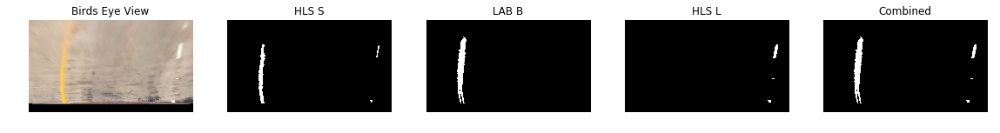

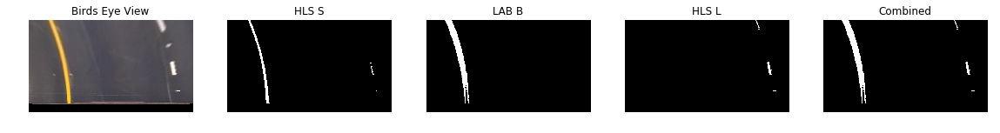

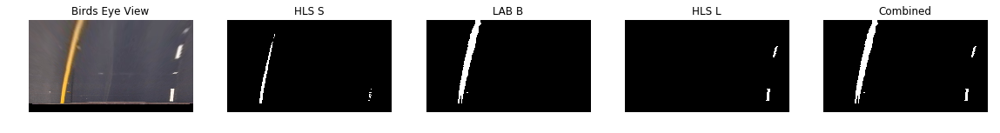

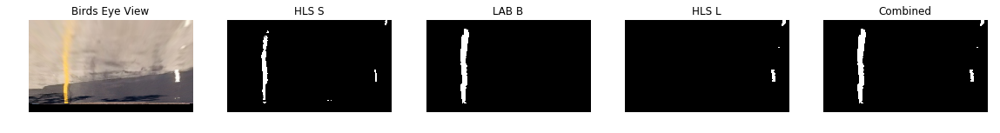

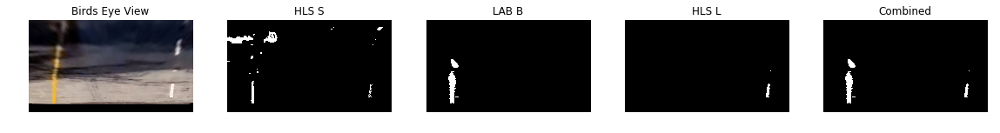

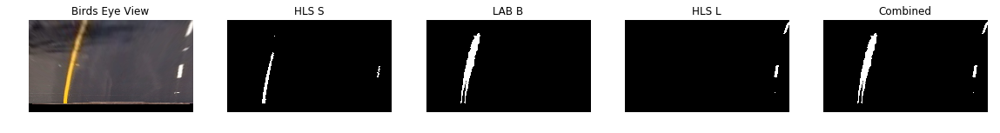

In [21]:
print('All test images non-normalized')
test_images = glob.glob('test_images/test*.jpg')
for fname in test_images:
    img = cv2.imread(fname)
    img_bev_undist, M, Minv = birds_eye_view(undistort(img), src, dst)
    apply_thresholds(img_bev_undist, show=True)

All test images normalized


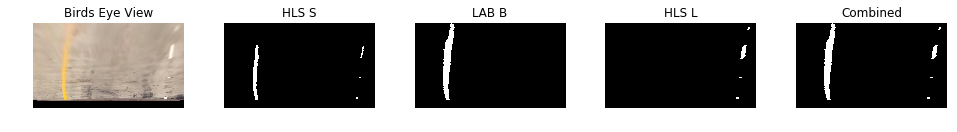

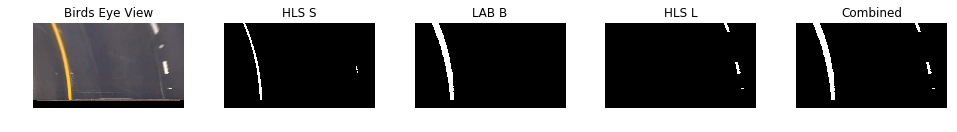

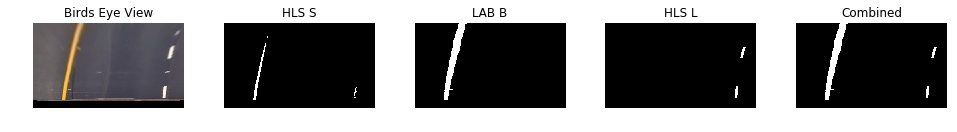

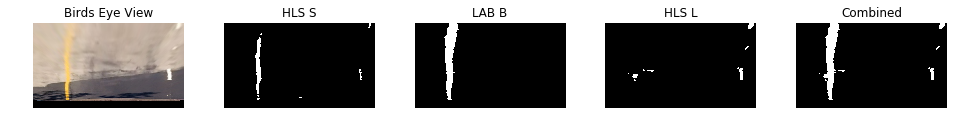

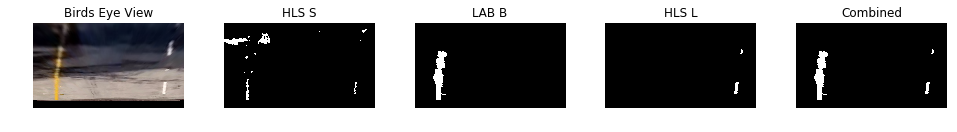

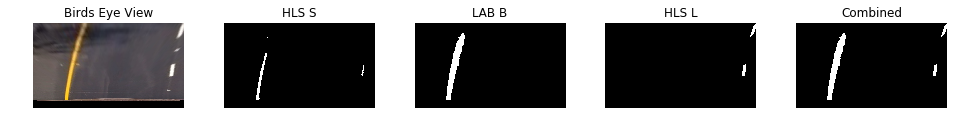

In [22]:
print('All test images normalized')
test_images = glob.glob('test_images/test*.jpg')
for fname in test_images:
    img = cv2.imread(fname)
    img_bev_undist, M, Minv = birds_eye_view(undistort(img), src, dst)
    apply_thresholds_norm(img_bev_undist, show=True)

Inspection of the above images leads to selection of the normalized thresholds since they perform better in low light conditions.  This can clearly be seen in the 2nd to last image which has some dark shadows.

## Step 4 - Detect Lane Lines<a name="detection"></a>

Fit a polynomial to the lane lines

float64


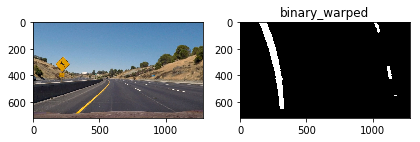

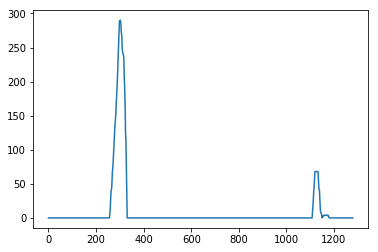

In [23]:
# Lesson 13.33 - Line Finding Method
# histogram along all the columns in the lower half of the image like this:

img = cv2.imread('test_images/test2.jpg')
#plt.figure(figsize=(16,16))
plt.figure()
plt.subplot(121)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.subplot(122)
plt.tight_layout()
img_bev_undist, M, Minv = birds_eye_view(undistort(img), src, dst)
binary_warped = apply_thresholds_norm(img_bev_undist)
print(binary_warped.dtype)
plt.imshow(binary_warped, cmap='gray')
plt.title('binary_warped')
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
plt.figure()
plt.plot(histogram)
#plt.axes().set_aspect('equal', 'datalim')

In [24]:
# Lesson 13.33 - Sliding Window
#
# Implement Sliding Windows and Fit a Polynomial
# ----------------------------------------------------------------------------
# Suppose you've got a warped binary image called binary_warped and you want
# to find which "hot" pixels are associated with the lane lines. Here's a basic
# implementation of the method shown in the animation above. You should think
# about how you could improve this implementation to make sure you can find
# the lines as robustly as possible!

def sliding_window_new_fit(binary_warped, show=False):

    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    if DEBUG:
        plt.figure()
        plt.plot(histogram)
        plt.show()
        print('midpoint: ', midpoint, 'leftx_base:', leftx_base, 'rightx_base:', rightx_base)

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 40
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (255,255,0), 2)
        #plt.imshow(out_img)
        #plt.show()
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (255,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        if DEBUG > 1:
            print('window: ', window)
            print(len(good_left_inds), len(good_right_inds))
            
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    if show:
        # Lesson 13.33 - Visualization
        # At this point, you're done! But here is how you can visualize the result as well:

        # Generate x and y values for plotting
        plt.figure()
        plt.title('Sliding Window New')
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 100, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [100, 100, 255]
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.show()
        print('Polynomial Fit: ', left_fit, right_fit)
    
    return left_fit, right_fit, leftx, lefty, rightx, righty

In [25]:
# Lesson 13.33
# Skip the sliding windows step once you know where the lines are
# Now you know where the lines are you have a fit! In the next frame of video you
# don't need to do a blind search again, but instead you can just search in a margin
# around the previous line position like this:

# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!

def sliding_window_found_fit(binary_warped, last_left_fit, last_right_fit, show=False):
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (last_left_fit[0]*(nonzeroy**2) + last_left_fit[1]*nonzeroy + 
    last_left_fit[2] - margin)) & (nonzerox < (last_left_fit[0]*(nonzeroy**2) + 
    last_left_fit[1]*nonzeroy + last_left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (last_right_fit[0]*(nonzeroy**2) + last_right_fit[1]*nonzeroy + 
    last_right_fit[2] - margin)) & (nonzerox < (last_right_fit[0]*(nonzeroy**2) + 
    last_right_fit[1]*nonzeroy + last_right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    new_left_fit = np.polyfit(lefty, leftx, 2)
    new_right_fit = np.polyfit(righty, rightx, 2)
    
    #----------------------------------------------------------------------------------
    if show:
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = new_left_fit[0]*ploty**2 + new_left_fit[1]*ploty + new_left_fit[2]
        right_fitx = new_right_fit[0]*ploty**2 + new_right_fit[1]*ploty + new_right_fit[2]
        # Lesson 13.33
        # And you're done! But let's visualize the result here as well
        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 100, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 100, 255]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                      ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                      ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        plt.imshow(result)
        plt.title('Sliding Window Found')
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.show()
        print('Polynomial Found Fit: ', new_left_fit, new_right_fit)
    #-----------------------------------------------------------------------------------
    
    return new_left_fit, new_right_fit, leftx, lefty, rightx, righty

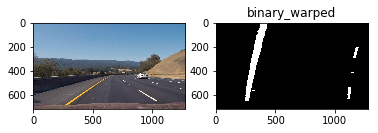

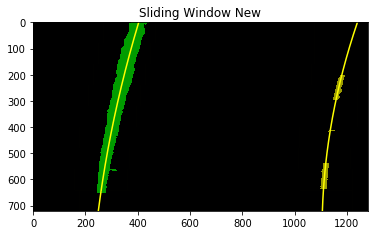

Polynomial Fit:  [  1.18866809e-04  -2.99664675e-01   4.03656451e+02] [  2.13251381e-04  -3.39268232e-01   1.23983447e+03]


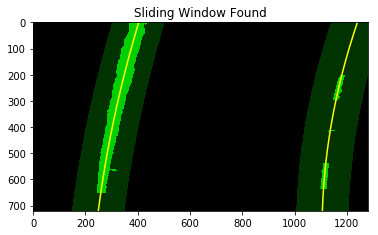

Polynomial Found Fit:  [  1.18866809e-04  -2.99664675e-01   4.03656451e+02] [  2.13251381e-04  -3.39268232e-01   1.23983447e+03]


In [26]:
DEBUG=0

img = cv2.imread('test_images/test3.jpg')
#img = mpimg.imread('test_images/test3.jpg')
#img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#plt.figure(figsize=(16,16))
plt.figure()
plt.subplot(121)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.subplot(122)
img_bev_undist, M, Minv = birds_eye_view(undistort(img), src, dst)
binary_warped = apply_thresholds_norm(img_bev_undist)
plt.imshow(binary_warped, cmap='gray')
plt.title('binary_warped')

last_left_fit, last_right_fit, leftx, lefty, rightx, righty = sliding_window_new_fit(binary_warped, show=True)
left_fit, right_fit, leftx, lefty, rightx, righty = sliding_window_found_fit(binary_warped, last_left_fit, last_right_fit, True)
#np.set_printoptions(precision=2)
np.set_printoptions(suppress=True)

It should be noted below that the last term in the polynomial fit is the intercept with the top of the image...

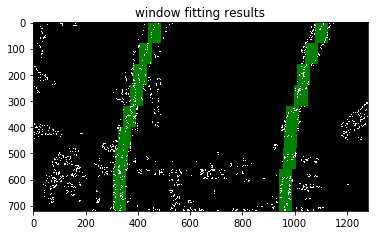

In [27]:
# Lesson 13.34
# Finding Lanes via Convolution

# Read in a thresholded image
warped = mpimg.imread('examples/warped-example.jpg')
# window settings
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(image.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(image.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(image[int(image.shape[0]-(level+1)*window_height):int(image.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,image.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,image.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

window_centroids = find_window_centroids(warped, window_width, window_height, margin)

# If we found any window centers
if len(window_centroids) > 0:

    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)

    # Go through each level and draw the windows 
    for level in range(0,len(window_centroids)):
        # Window_mask is a function to draw window areas
        l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
        r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
        # Add graphic points from window mask here to total pixels found 
        l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
        r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

    # Draw the results
    template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
    zero_channel = np.zeros_like(template) # create a zero color channel
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
    warpage= np.dstack((warped, warped, warped))*255 # making the original road pixels 3 color channels
    output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results
 
# If no window centers found, just display orginal road image
else:
    output = np.array(cv2.merge((warped,warped,warped)),np.uint8)

# Display the final results
plt.imshow(output)
plt.title('window fitting results')
plt.show()

## Step 5 - Determine Lane Curvature and Vehicle Position<a name="curvature"></a>

In this section, we don some calculations to determine the lane curvature.
We also would like to indicate the vehicle position with respect to center of the lane lines.  We assume the camera is mounted in the center of the vehicle.

The formula to calculate the radius of curvature is defined at http://www.intmath.com/applications-differentiation/8-radius-curvature.php.  Government regulations on road curvature are defined at http://onlinemanuals.txdot.gov/txdotmanuals/rdw/horizontal_alignment.htm#BGBHGEGC

These functions were modified from the content in  Lesson 13.35

In [28]:
# Define constants for pixel to distance conversion in meters
X_METERS_PER_PIXEL = 3.7/700 # meters per pixel in x dimension
Y_METERS_PER_PIXEL = 30/720 # meters per pixel in y dimension

# For this project, you can assume that if you're projecting a section of lane similar to the images
# above, the lane is about 30 meters long and 3.7 meters wide. Or, if you prefer to derive a conversion
# from pixel space to world space in your own images, compare your images with U.S. regulations that
#require a minimum lane width of 12 feet or 3.7 meters, and the dashed lane lines are 10 feet or
# 3 meters long each.

In [29]:
def calc_curvature(binary_warped, leftx, lefty, rightx, righty):
    # This function needs the "x and y" scatter plot coordinates of lane pixels
    # We use these to re-calculate the polynomial fit in the new coordinate system
    
    h = img.shape[0] # image height
    y_eval = h-1
    
    # Fit new polynomials to x,y in world space
    left_fit_cr  = np.polyfit(lefty*Y_METERS_PER_PIXEL, leftx*X_METERS_PER_PIXEL, 2)
    right_fit_cr = np.polyfit(righty*Y_METERS_PER_PIXEL, rightx*X_METERS_PER_PIXEL, 2)
    
    # Calculate the new radius of curvature
    left_curverad  = ((1 + (2*left_fit_cr[0]*y_eval*Y_METERS_PER_PIXEL + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*Y_METERS_PER_PIXEL + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    curve_radius_m = (left_curverad + right_curverad) / 2

    return curve_radius_m

In [30]:
def calc_position(img, left_fit, right_fit):

    h = img.shape[0] # image height
    w = img.shape[1] # image width
    vehicle_position_pixel= w/2
    
    if left_fit is None:
        left_lane_x_intercept = NaN
        print('Left fit not found')
    else:
        left_lane_x_intercept = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
    
    if right_fit is None:
        right_lane_x_intercept = NaN
        print('right fit not found')
    else:
        right_lane_x_intercept = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
    
    lane_center_pixel = (right_lane_x_intercept + left_lane_x_intercept) / 2
    vehicle_position_m = (vehicle_position_pixel - lane_center_pixel) * X_METERS_PER_PIXEL
    
    if DEBUG:
        print("left_lane_x_intercept: ", left_lane_x_intercept, "right_lane_x_intercept", right_lane_x_intercept)
        lane_width = (abs(right_lane_x_intercept) - abs(left_lane_x_intercept)) * X_METERS_PER_PIXEL
        print("lane width: ", lane_width)

    return vehicle_position_m

In [31]:
DEBUG=1
print('Lane radius of curvature: %.2f m' % calc_curvature(img, leftx, lefty, rightx, righty))
print('Vehicle distance from lane center: %.2f m' % calc_position(img, left_fit, right_fit))

Lane radius of curvature: 1076.14 m
left_lane_x_intercept:  249.518438921 right_lane_x_intercept 1106.11086063
lane width:  4.52770280045
Vehicle distance from lane center: -0.20 m


## Step 6 - Reproject Lane Boundaries<a name="boundaries"></a>
Warp the detected lane boundaries back onto the original image

In [32]:
def draw_lane(undist, binary_img, left_fit, right_fit, Minv):
    # Modified from Lesson 13.36

    # Generate x and y values for plotting
    ploty      = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx  = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image to draw the lines on
    warp_zero  = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left   = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right  = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts        = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp    = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result     = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    return result

In [33]:
def draw_text(result, curvature, position):
    
    img = np.copy(result)
    h   = img.shape[0]
    
    if position > 0:
        location = 'right'
    else:
        location = 'left'

    cv2.putText(img, 'Vehicle is {:.2f}m '.format(abs(position)) + location + ' of center',
        (30, 120), cv2.FONT_HERSHEY_SIMPLEX, 1.3, (255, 255, 255),  3)

    
    if curvature > 10000:
        curvature_text = 'straight lane'
    else:
        curvature_text = '{:.0f}m'.format(curvature)
        
    cv2.putText(img, 'Radius of curvature: ' + curvature_text,
                (30, 80), cv2.FONT_HERSHEY_SIMPLEX, 1.3, (255, 255, 255),  3)

    
    return img

Test out the draw text function:

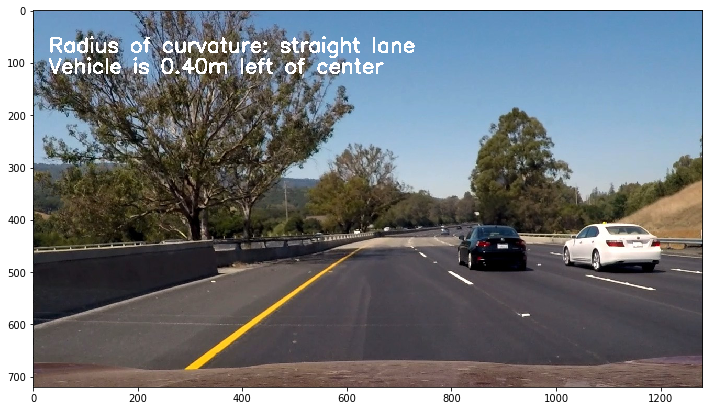

In [34]:
img = cv2.imread('test_images/test6.jpg')
new_img = draw_text(img, 15000, -0.4)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(new_img, cv2.COLOR_BGR2RGB))
plt.tight_layout()

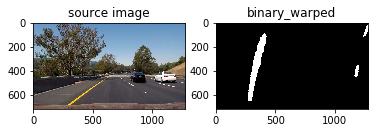

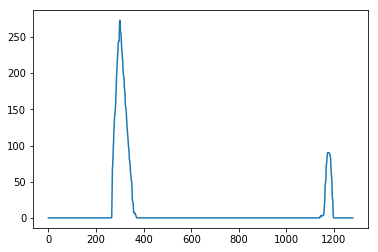

midpoint:  640 leftx_base: 300 rightx_base: 1173


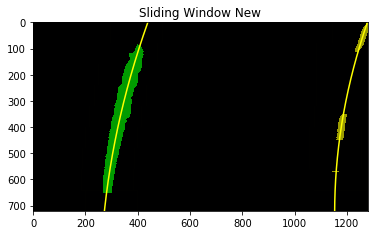

Polynomial Fit:  [   0.00017339   -0.35488653  438.50762747] [    0.00023688    -0.34410609  1278.00969878]
left_lane_x_intercept:  272.875019559 right_lane_x_intercept 1153.0523053
lane width:  4.65236565319


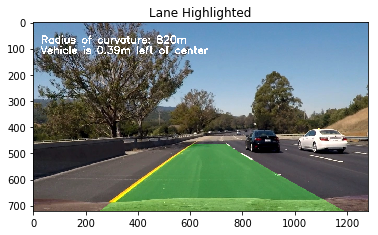

Polynomial Fit:  [   0.00017339   -0.35488653  438.50762747] [    0.00023688    -0.34410609  1278.00969878]
Lane radius of curvature: 820.35 m
Vehicle distance from lane center: -0.39 m


In [35]:
# Define constants for pixel to distance conversion in meters
X_METERS_PER_PIXEL = 3.7/700 # meters per pixel in x dimension
Y_METERS_PER_PIXEL = 30/720 # meters per pixel in y dimension

img = cv2.imread('test_images/test6.jpg')
plt.figure()
plt.subplot(121)
plt.title('source image')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.subplot(122)
img_bev_undist, M, Minv = birds_eye_view(undistort(img), src, dst)
binary_warped = apply_thresholds_norm(img_bev_undist)
plt.imshow(binary_warped, cmap='gray')
plt.title('binary_warped')

left_fit, right_fit, leftx, lefty, rightx, righty = sliding_window_new_fit(binary_warped, show=True)
np.set_printoptions(suppress=True)

result = draw_lane(img, binary_warped, left_fit, right_fit, Minv)
curvature = calc_curvature(img, leftx, lefty, rightx, righty)
position = calc_position(img, left_fit, right_fit)
result = draw_text(result, curvature, position)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title('Lane Highlighted')
plt.show()

print('Polynomial Fit: ', left_fit, right_fit)
print('Lane radius of curvature: %.2f m' % curvature)
print('Vehicle distance from lane center: %.2f m' % position)

## Step 7 - Video Processing Pipeline<a name="calculations"></a>

Output a visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position!


In [36]:
# Lesson 13.36
# Define a class to receive the characteristics of each line detection

class Line():

    def __init__(self):
        self.num_frames = 8                           # number of frames to use for algorithms (lane fit, curvature, position)
        self.detected = False                         # was the line detected in the last iteration?
        # Using allx and ally for the "current" frame
        self.allx = None                              # x values for detected line pixels
        self.ally = None                              # y values for detected line pixels
        # It is not clear what the following should be used for.  Xfitted is 
        self.recent_xfitted = []                      # x values of the last n fits of the line (scatter plot)
        self.bestx = None                             # average x values of the fitted line over the last n iterations - equivalent to left_fit???
        # These are polynomial coeficcient related
        self.best_fit = None                          # polynomial coefficients averaged over the last n iterations
        self.current_fit = [np.array([False])]        # polynomial coefficients for the most recent fit
        self.diffs = np.array([0,0,0], dtype='float') # difference in fit coefficients between last and new fits
        # Seems we also need to store the last coefficients to average them
        # These are the output values (radius and position)
        self.last_curvature = None
        self.radius_of_curvature = None               # radius of curvature of the line in some units
        self.line_base_pos = None                     # distance in meters of vehicle center from the line

        
    def new_fit(self, img, line_fit, x, y):
    
        # line_fit = new_left_fit = self.current_fit # np.polyfit results
        # x = linex
        # y = liney
        h = img.shape[0] # image height
        w = img.shape[1] # image width
        
        if line_fit is not None:             # Polynomial was calculated
            # Update the class variables
            self.detected = True
            self.current_fit = line_fit
            self.allx = x
            self.ally = y
            
            # These may be redundant but it is clear what the variables contain
            # X and Y scatter plots values
            ploty = np.linspace(0, h-1, h)
            plotx  = line_fit[0]*ploty**2 + line_fit[1]*ploty + line_fit[2]
            
            if DEBUG:
                plt.plot(plotx, ploty, color='red')
                plt.xlim(0, 1280)
                plt.ylim(720, 0)
            
            # Keep the last "n" frames for averaging
            if(len(self.recent_xfitted) >= self.num_frames):
                self.recent_xfitted.pop(0)
            self.recent_xfitted.append(plotx)
            
            # Find the best fit using multiple frames
            self.bestx               = np.mean(self.recent_xfitted,axis=0)
            self.best_fit            = np.polyfit(ploty, self.bestx, 2)
            
            if DEBUG:
                plt.plot(self.bestx, ploty, color='blue')
            
            # Calculate curvature and position
            self.calc_curvature(img, self.best_fit)
            self.calc_position(img, self.best_fit)
        else:
            self.detected = False
            if DEBUG:
                print('Lane not detected')

        
    def calc_curvature(self, img, best_fit):  
        # Take the best fit and generate new scatter plot values
        # Fit a new polynomial in world coordinates (meters) and calculate the curvature
    
        h = img.shape[0]
        y_eval = h-1
        
        # Generate the scatter plot values again for the best fit
        ploty  = np.linspace(0, h-1, h)
        plotx  = best_fit[0]*ploty**2 + best_fit[1]*ploty + best_fit[2]
        
        # Fit new polynomials to x,y in world space
        line_fit_cr  = np.polyfit(ploty*Y_METERS_PER_PIXEL, plotx*X_METERS_PER_PIXEL, 2)
        
        if DEBUG:
            plt.plot(plotx, ploty, color='yellow')
            plt.title('Class Best Fit for curvature')
            plt.show()
        
        # Calculate the new radius of curvature
        calc_radius_curvature = ((1 + (2*line_fit_cr[0]*y_eval*Y_METERS_PER_PIXEL + line_fit_cr[1])**2)**1.5) / np.absolute(2*line_fit_cr[0])
        
        if self.last_curvature is None:
            self.last_curvature = calc_radius_curvature
        
        if abs(calc_radius_curvature - self.last_curvature) > 1000:
            # Take weighted average
            self.radius_of_curvature = ( 0.9 * self.last_curvature + 0.1 * calc_radius_curvature)
        else:
            self.radius_of_curvature = calc_radius_curvature
        
        self.last_curvature = calc_radius_curvature
        
        if DEBUG:
            print('Radius of curvature: %.2f m' % self.radius_of_curvature)
        # print('Best fit:', best_fit) <-- This should be plotted, not written to console
        
        

    def calc_position(self, img, best_fit):
        # This function takes the image height and fit (polynomials) to calculate
        # the X intercept near the vehicle which allows us to determine the position
        # of the vehicle with respect to the center of the image (where the camera is mounted)
        
        h = img.shape[0] # image height
        w = img.shape[1] # image width
        vehicle_position_pixel= w/2
        
        if best_fit is None:
            x_intercept = NaN
            print('Left fit not found')
        else:
            x_intercept = best_fit[0]*h**2 + best_fit[1]*h + best_fit[2]
            
        # Need to convert to meters...
        self.line_base_pos = (vehicle_position_pixel - x_intercept) * X_METERS_PER_PIXEL

It appears that the lane width is correct!  Should be at least 12 feet.

In [37]:
# ---------------------------------------------------------------
# Pipeline constants
# ---------------------------------------------------------------
# Define constants for pixel to distance conversion in meters
X_METERS_PER_PIXEL = 3.7/700 # meters per pixel in x dimension
Y_METERS_PER_PIXEL = 30/720 # meters per pixel in y dimension
# Perspective Transform soure and destination
src = np.float32([(718, 470),
                  (1072,700),
                  (235, 700),
                  (570, 470)])

dst = np.float32([(1072,100),
                  (1072,650),
                  (235,650),
                  (235,100)])
# Load camera calibration parameters upon Init of each class

def pipeline(img, show=False):
    
    # Apply camera calibration and reprojection to birds eye view
    img_bev_undist, M, Minv = birds_eye_view(undistort(img), src, dst)
    
    # Apply thresholds to create a binary image of the lane lines
    binary_warped = apply_thresholds_norm(img_bev_undist)
    
    # Check to see if we had a detection in the last frame, select optimal algorithm
    # Fit both left and right lanes with one function call
    if Left.detected and Right.detected:
        left_fit, right_fit, leftx, lefty, rightx, righty = sliding_window_found_fit(binary_warped, Left.current_fit, Right.current_fit, show)
    else:
        left_fit, right_fit, leftx, lefty, rightx, righty = sliding_window_new_fit(binary_warped, show)
            
    # Add fits to our lane tracking class and performs filtering
    Left.new_fit(binary_warped, left_fit, leftx, lefty)
    Right.new_fit(binary_warped, right_fit, rightx, righty)
    
    # Note: This function uses both left and right lane data for the best results
    curvature = (Left.radius_of_curvature + Right.radius_of_curvature) / 2
    
    if DEBUG:
        print('Non-class Lane radius of curvature: %.2f m' % calc_curvature(binary_warped, leftx, lefty, rightx, righty))
    
    # Use the best fit for calc position
    # Note: This function uses both left and right lane data for the best results
    
    position  = Left.line_base_pos + Right.line_base_pos
    
    # Draw the lane line and overlay text from calculations
    img_lane  = draw_lane(img, binary_warped, Left.best_fit, Right.best_fit, Minv)
    result    = draw_text(img_lane, curvature, position)

    return result

In [38]:
# Since the image from a video is loaded in RGB color space, we need to convert before passing to the algorithms
# Image processing pipeline for videos


def video_pipeline(img, show=False):
          
    pipeline_video = pipeline(cv2.cvtColor(img, cv2.COLOR_RGB2BGR), show)
    result = cv2.cvtColor(pipeline_video, cv2.COLOR_BGR2RGB)

    return result

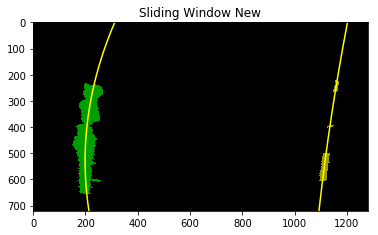

Polynomial Fit:  [   0.00040421   -0.42770833  311.97753908] [    0.00005518    -0.19093014  1201.92925462]
Positions:  2.25399209312 -2.39478148539
2.25399209312
-2.39478148539
15.2518823073


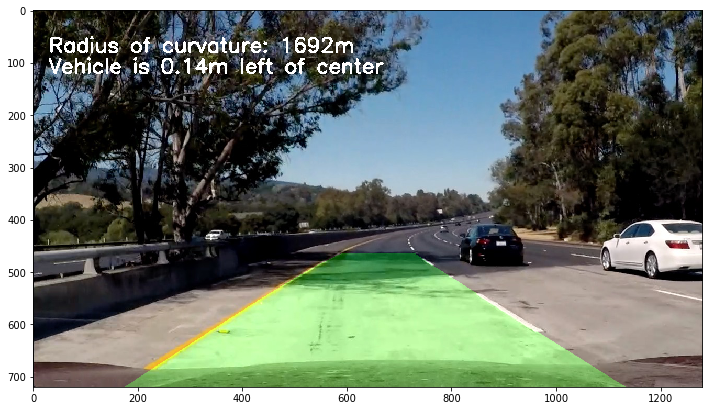

In [39]:
DEBUG=0
Left = Line()
Right = Line()
img = cv2.imread('test_images/test5.jpg')
new_img = pipeline(img, True)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(new_img, cv2.COLOR_BGR2RGB))
plt.tight_layout()
print('Positions: ', Left.line_base_pos, Right.line_base_pos)

# Debug code of position

print(Left)
print(Left.line_base_pos)
print(Right.line_base_pos)
lane_width = abs(Left.line_base_pos) + abs(Right.line_base_pos)
print(lane_width * 3.28084)

#Left.calc_curvature(img)

### Generate Project Video

In [40]:
# ToDo: Convert this cell to Python when ready to run.
# Change to "Raw NBConvert" to prevent this from running when "Run All"

Left = Line()
Right = Line()
video_output = 'project_video-result.mp4'
clip1 = VideoFileClip("project_video.mp4")#.subclip(0,2)
white_clip = clip1.fl_image(video_pipeline) 
white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video project_video_final.mp4
[MoviePy] Writing video project_video_final.mp4


100%|███████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [05:09<00:00,  4.38it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_final.mp4 



In [43]:
Left = Line()
Right = Line()
video_output = 'challenge_video-result.mp4'
clip1 = VideoFileClip("challenge_video.mp4")#.subclip(0,2)
white_clip = clip1.fl_image(video_pipeline) 
white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video challenge_video-result.mp4
[MoviePy] Writing video challenge_video-result.mp4


100%|██████████████████████████████████████████████████████████████████████████████████| 485/485 [12:06<00:00,  2.98it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video-result.mp4 



In [42]:
Left = Line()
Right = Line()
video_output = 'harder_challenge_video-result.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")#.subclip(0,2)
white_clip = clip1.fl_image(video_pipeline) 
white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video challenge_video_final.mp4
[MoviePy] Writing video challenge_video_final.mp4


100%|███████████████████████████████████████████████████████████████████████████████▉| 1199/1200 [12:03<00:00,  1.63it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_final.mp4 

